In [3]:
!python --version

Python 3.10.6


In [4]:
!python -m pip install --upgrade pip
!python -m pip install --upgrade Pillow
!python -m pip install shapely

     ---------------------------------------- 2.1/2.1 MB 3.9 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 21.2.4
    Uninstalling pip-21.2.4:


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'c:\\python310\\lib\\site-packages\\pip-21.2.4.dist-info\\entry_points.txt'
Consider using the `--user` option or check the permissions.


[notice] A new release of pip available: 21.2.4 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 21.2.4 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 21.2.4 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
!pip install wheel


[notice] A new release of pip available: 21.2.4 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
from PIL import Image, ImageOps, ImageDraw
from random import randrange, uniform, random
from IPython.display import display
from shapely import Polygon, Point, LineString, GeometryCollection

In [7]:
def loadImages(prefix, count):
    images = []
    for i in range(1, count):
        images.append(Image.open(prefix + '{:0>3}'.format(i) + '.png'))
    return images

In [8]:
def getAverageSize(images):
    width = int(sum([im.width for im in images])/len(images))
    height = int(sum([im.height for im in images])/len(images))
    return (width, height)

In [9]:
def createTree(images, width, height, symmetric=False, max_rotation=50,
               horizontal_packing=0.5, vertical_offset=0.05, vertical_packing=0.25, min_scaling=0.5):
    im = Image.new('RGBA', (width, height), (0,0,0,0))
    avgWidth, avgHeight = getAverageSize(images)
    
    lastLine = height - 2 * avgHeight
    
    y = lastLine
    offset = 0
    while y > 0:
        x = offset
        while x + avgWidth < width:
            delta = randrange(int(avgWidth * horizontal_packing))

            leaf = images[randrange(len(images))]
            #if x + delta + leaf.width > width:
            #    next
            scale = uniform(min_scaling, 1.0)
            leaf = leaf.resize((int(leaf.width * scale), int(leaf.height * scale)))
            leaf = leaf.rotate(-randrange(max_rotation), expand=1)
            im.paste(leaf, (x, y + randrange(50) - 25), leaf)
            delta = randrange(int(avgWidth / horizontal_packing))
            leaf = images[randrange(len(images))]
            if x + delta + leaf.width > width:
               next
            scale = uniform(min_scaling, 1.0)
            leaf = leaf.resize((int(leaf.width * scale), int(leaf.height * scale)))
            leaf = leaf.rotate(randrange(max_rotation), expand=1)
            im.paste(leaf, (x, y + avgHeight + randrange(25) - 12), leaf)


            x = x + delta
        y -= int(vertical_packing * avgHeight)
        offset += int(avgWidth * vertical_offset)
    return im

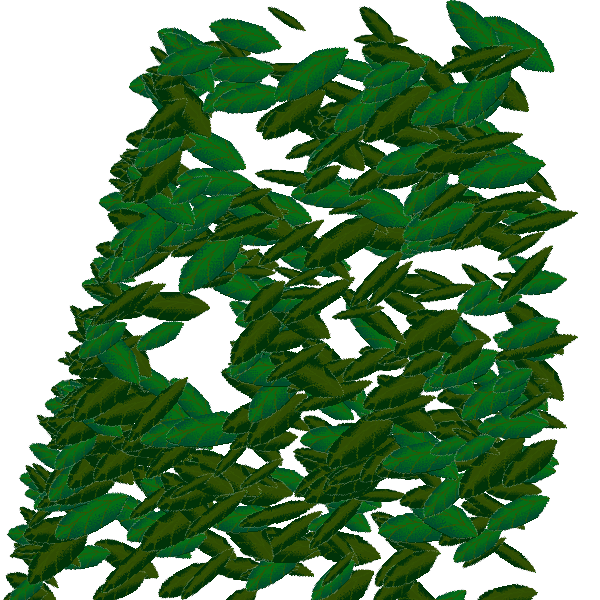

In [10]:
im = createTree(loadImages('leaf-b-', 4), 600, 600, False, vertical_packing=0.5)
display(im)

In [11]:


def createTree2(images, width, height, 
               area,
               min_rotation=-30, max_rotation=30,
               quantity=50,min_scaling=0.5, flip=False, shadow=False, add_depth=True):
    im = Image.new('RGBA', (width, height), (0,0,0,0))
    count = 0
    while count < quantity:
        x = randrange(0, width)
        y = randrange(0, height)
        
        
        def darken(x):
            if x == 255:
                return 255
            else:
                d =  max(count, 50) / quantity
                return int(x * d * d)
        
        leaf = images[randrange(len(images))]
        scale = uniform(min_scaling, 1.0)
        leaf = leaf.resize((int(leaf.width * scale), int(leaf.height * scale)))
        if flip and uniform(0, 1) > 0.5:
            leaf = ImageOps.mirror(leaf)
        leaf = leaf.rotate(randrange(min_rotation, max_rotation), expand=1)
        
        box = Polygon(((x, y), (x + leaf.width, y), (x + leaf.width, y + leaf.height),
                       (x, y + leaf.height)))
        
        if area.contains(box):
            if add_depth:
                leaf = Image.eval(leaf, darken)
            count += 1
            if shadow:
                shadow_image = Image.new('RGBA', (leaf.width, leaf.height), (0,0,0,100))
                #im.paste(shadow_image, (x - 2, y + 2), leaf)
                
                shadow_to_compose = Image.new('RGBA', (leaf.width, leaf.height), (0,0,0,0))
                shadow_to_compose.paste(shadow_image, (0, 0), leaf)
                im.alpha_composite(shadow_to_compose, (max(x - 2, 0), y + 2))
            im.paste(leaf, (x, y), leaf)
    return im

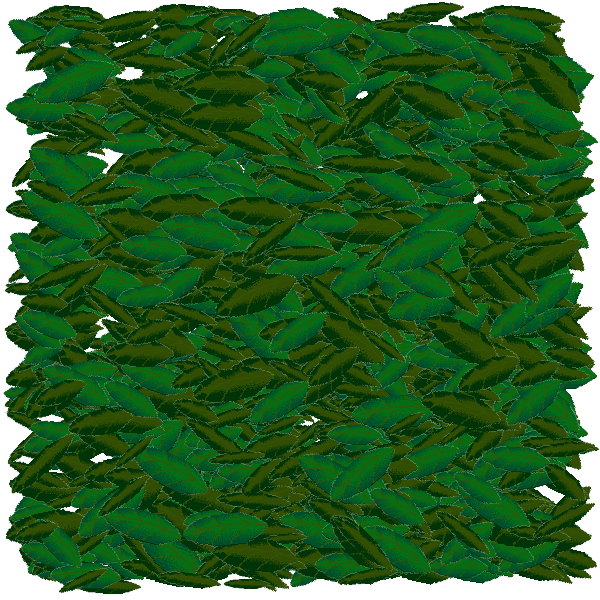

In [12]:
im = createTree2(loadImages('leaf-b-', 4), 600, 600, Polygon(((0, 0), (600, 0), (600,600), (0, 600))),
                 min_rotation=-45, max_rotation=45, quantity=1500, flip=False, shadow=False, add_depth=False)
display(im)

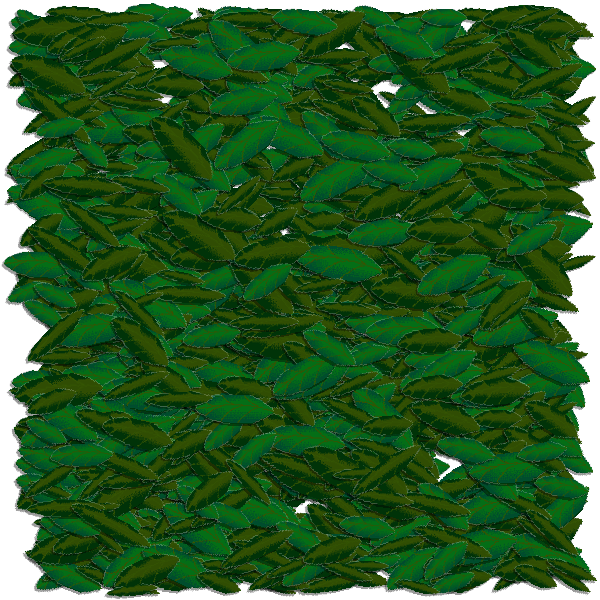

In [13]:
im = createTree2(loadImages('leaf-b-', 4), 600, 600, Polygon(((0, 0), (600, 0), (600,600), (0, 600))),
                 min_rotation=-45, max_rotation=45, quantity=1500, flip=False, shadow=True, add_depth=False)
display(im)

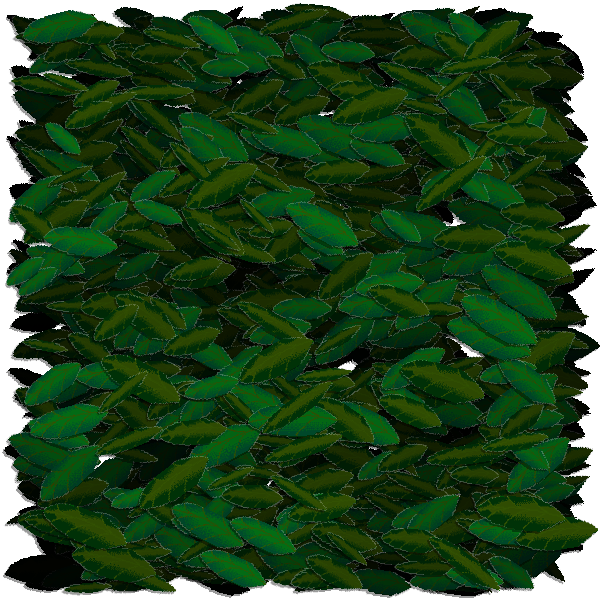

In [14]:
im = createTree2(loadImages('leaf-b-', 4), 600, 600, Polygon(((0, 0), (600, 0), (600,600), (0, 600))),
                 min_rotation=-45, max_rotation=45, quantity=1500, flip=False, shadow=True, add_depth=True)
display(im)

In [15]:
import math
def createCircle(x0, y0, xRadius, yRadius, steps):
    points = []
    t = 0
    delta = 6.28318530718 / steps
    while t < 6.28318530718:
        point = (xRadius * math.cos(t) + x0, yRadius * math.sin(t) + y0)
        points.append(point)
        t += delta
    return Polygon(points)
    
def createBox(width, height):
    return Polygon(((0, 0), (width, 0), (width, height), (0, height)))
        

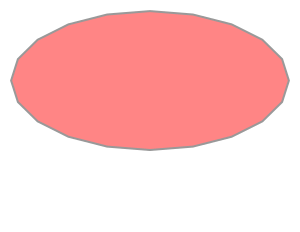

In [16]:
createCircle(0, 0, 200, 100, 20)

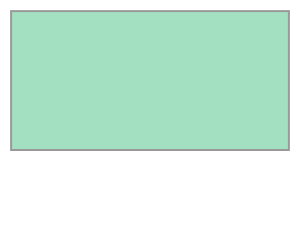

In [17]:
createBox(400, 200)

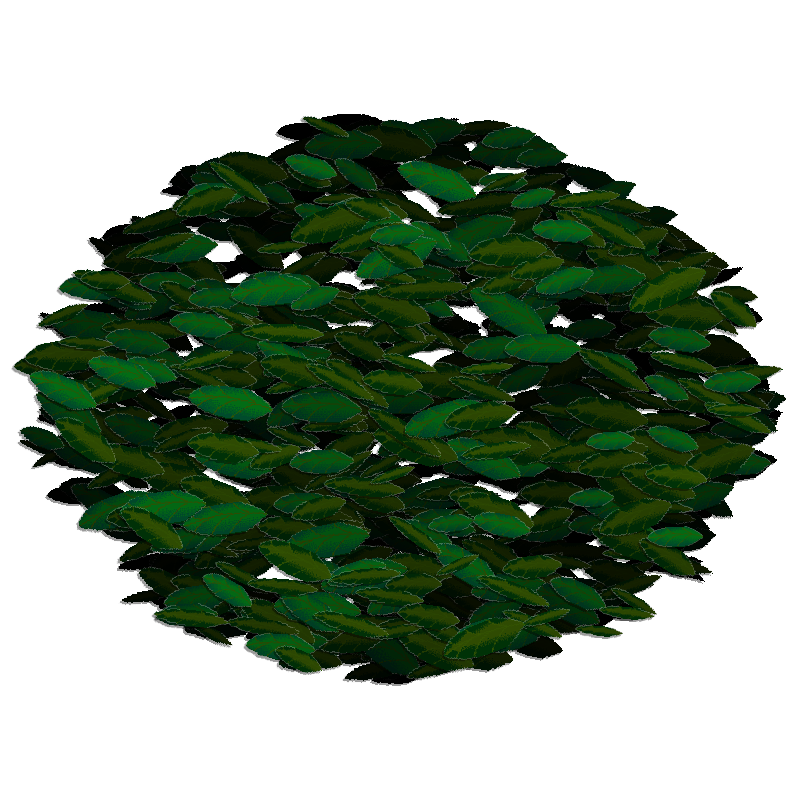

In [18]:
im = createTree2(loadImages('leaf-b-', 4), 800, 800, createCircle(400, 400, 400, 300, 20),
                 min_rotation=-35, max_rotation=30, quantity=1000, flip=False, shadow=True)
display(im)

In [19]:
def createTree3(images, width, height, 
               area,
               leaves_per_bunch=5, distance_to_center=45,
               quantity=50, min_scaling=0.5, shadow=False, half_circle=False,  add_depth=True, phase=0,
               minRotation=-10, maxRotation=10):
    im = Image.new('RGBA', (width, height), (0,0,0,0))
    draw = ImageDraw.Draw(im)
    count = 0
    while count < quantity:
        x = randrange(0, width)
        y = randrange(0, height)        
        point = Point(x, y)
        
        if area.contains(point):
            def darken(v):
                if v > 200:
                    return 255
                else:
                    d = count / quantity
                    return int(v * d * d)
            n = int(randrange(leaves_per_bunch - 1, leaves_per_bunch + 2))
            randomRotation = randrange(minRotation, maxRotation)
            m = int(n/2) if half_circle else n 
            for i in range(phase, phase + m):
                leaf = images[randrange(len(images))]
                scale = uniform(min_scaling, 1.0)
                leaf = leaf.resize((int(leaf.width * scale), int(leaf.height * scale)))
                
                angle = i * 6.28 / n + randomRotation * 6.28 / 360
                angleDegrees = i * 360 / n + randomRotation
                r = distance_to_center
                
                leaf = leaf.rotate(-angleDegrees + 180, expand=1)
                
                newX = r * math.cos(angle) + x
                newY = r * math.sin(angle) + y
                
                w = leaf.width
                h = leaf.height
                
                if add_depth:
                    leaf = Image.eval(leaf, darken)
                draw.line([int(x), int(y), int(newX), int(newY)], fill=(50, 50, 0, 255))
                
                
                if shadow:
                    shadow_image = Image.new('RGBA', (leaf.width, leaf.height), (0,0,0,100))
                    shadow_to_compose = Image.new('RGBA', (leaf.width, leaf.height), (0,0,0,0))
                    shadow_to_compose.paste(shadow_image, (0, 0), leaf)
                    im.alpha_composite(shadow_to_compose, (max(int(newX - w/2) - 2, 0), max(int(newY - h/2) + 2, 0)))
                
                im.paste(leaf, (max(int(newX - w/2), 0), max(int(newY - h/2), 0)), leaf)
            count += 1
    return im

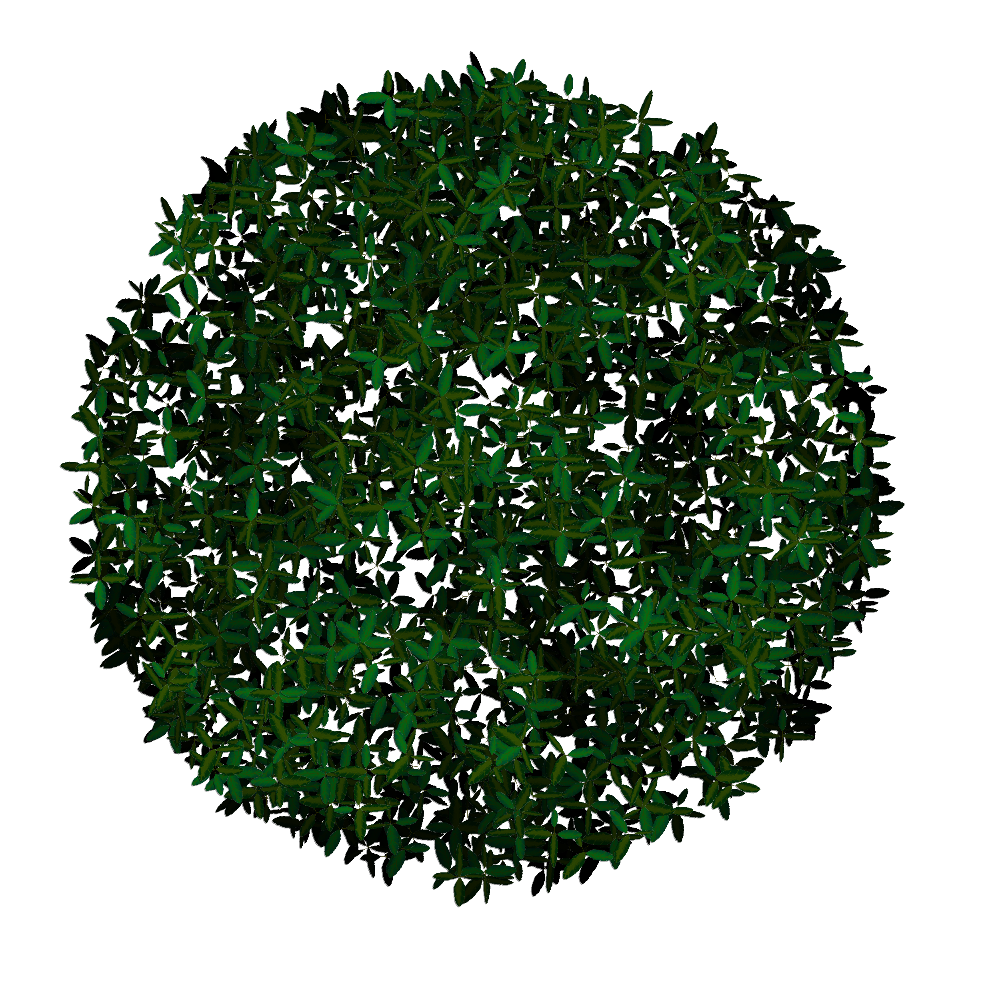

In [20]:
im = createTree3(loadImages('leaf-b-', 4), 2500, 2500, createCircle(1200, 1200, 1000, 1000, 20),
                 leaves_per_bunch=4, distance_to_center=40, quantity=1500, shadow=True)
#im.save("tree1.png")
display(im)


In [35]:
im.save("tree3.png")

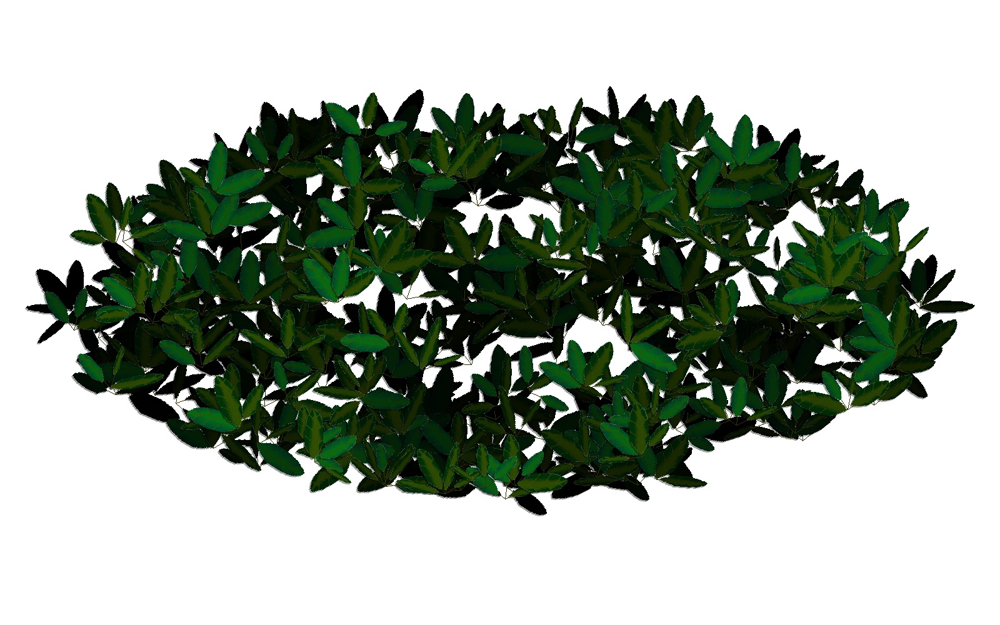

In [23]:
im = createTree3(loadImages('leaf-b-', 4), 1600, 1000, createCircle(800, 500, 700, 300, 20),
                 leaves_per_bunch=7, distance_to_center=45, quantity=360, shadow=True, half_circle=True, phase=4,
                minRotation=-45, maxRotation=45)
display(im)

In [39]:
im.save("tree4.png")

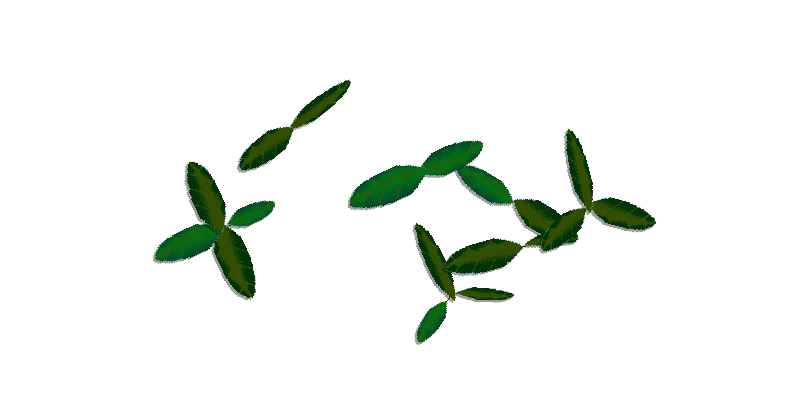

In [28]:
im = createTree3(loadImages('leaf-b-', 4), 800, 400, createCircle(400, 200, 200, 100, 40),
                 leaves_per_bunch=3, distance_to_center=35, quantity=7, shadow=True, half_circle=False, phase=0, add_depth=False,
                minRotation=-45, maxRotation=45)
display(im)

In [70]:
im.save("tree7.png")